<center>
<img src="Capture.PNG" alt="Alternative text" />
<h1 style="background-color:light yellow;font-family:monospace;font-size:300%;text-align:center">Sale Demand Prediction</h1>
</center>

<a id='Table_Contents'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">Table of Contents</h1>

* [Table of Contents](#Table_Contents)
* [1. Problem Definition](#Problem_Definition)
* [2. The Approach](#Approach)
* [3. Data](#Data)
    - [1 Data Scription](#Data_Description)
    - [2 Load Libraries](#Load_Libraries)
    - [3 Read Dataset](#Read_Dataset)
    - [4 Data Quality](#Data_Quality)
    
* [4. EDA](#EDA)
    - [1 Features](#Target_Label)
    - [2 Univariate Analysis](#Univariate_Analysis)
        - [Numerical Features](#Numerical_Features)
        - [Categorical Features](#Categorical_Features)
    - [3 Multivariate Analysis](#Multivariate_Analysis)
        - [Correlation between Numerical Features](#corr_numerical)
        - [Correlation between Categorical Features](#corr_categorical)
        - [Correlation between Categorical and Numeric Features](#corr_categorial_numeric)
        - [Relationship between Attrition_Flag and Numeric features](#attrition_numeric)
        - [Relationship between Attrition_Flag and Categorical features](#attrition_categorical)
        - [Relationship between Attrition_Flag and Card_Category](#attrition_card_category)
        - [Different Card Category Customers behavior Analysis](#behavior_card_category)
    
* [5. Feature Engineering](#Feature_Engineering)
    - [5.1 Create Features](#Features)
    - [5.2 Change the categorical features to One hot encoding](#one_hot_encoding)
    - [5.3 Generate X and y](#Generate_X_y)
    - [5.4 Splitting the data into train/test](#splitting_train_test)
    - [5.5 Feature Selection](#feature_selection)   
* [6. Model Building](#Model_Building)
    - [6.1 Light GBM Default Parameters Model](#Model_Default)
        - [Feature Importance](#Feature_Importance)
        - [Shap](#Shap)
        - [Error](#Error)
    - [6.2 Light GBM Model with Feature selection](#Model_Feature_Selection)
    - [6.3 Light GBM Model with Feature selection and Hyperparameter Tuning](#Model_Tuning)
* [7. LSTM](#LSTM)
    - [7.1 Transform the data into a time series problem](#Transform_Data_LSTM)
    - [7.2 Train/validation split](#Split_Data_LSTM)
    - [7.3 Model Building](#Model_Build_LSTM)
* [8. Deploy](#Deploy)
* [9. Conclusion](#Conclusion)

<a id='Problem_Definition'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">1. Problem Definition</h1>

Train dataset contains 5 years of sales data per 50 different items being sold in 10 different stores. It covers the period between 2013-01-01 and 2017-12-31.

We are expected to forecast the daily sales of each item in each store for the time interval of 2018-01-01 and 2018-03-31.

Data are from https://www.kaggle.com/code/ekrembayar/store-item-demand-forecasting-with-lgbm/data


Time series is a sequence of observations recorded at regular time intervals. It is composed of discrete-time periods that are ordered succesively. When each value of the time points are concatenated, these independent points will form a non-discrete data, reveal the correlations and by using this data it would be possible to have a prediction of what would be coming next.

Time Series are mostly used for:

monitor sensor data
track assets (such as cars of a fleet, items in a store)
business forecasting
understand past behaviours (of customers, stocks, etc.)
predict and plan future
evaluate current accomplishment

<a id='Approach'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">2. Approach</h1>

- I will first use LGBM then LSTM models for this problem
- Evaluation will be used SMAPE between forecasts and actual values. We define SMAPE = 0 when the actual and predicted values are both 0.

Symmetric mean absolute percentage error (SMAPE or sMAPE) is an accuracy measure based on percentage (or relative) errors. Errors with higher values will be adjusted by diving it to the sum of the forecast and actual value's average.


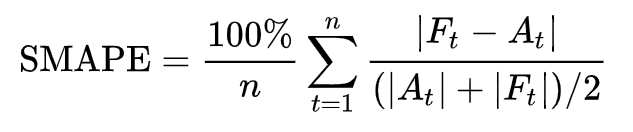

<a id='Approach'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">3. Data</h1>

<a id='Data_Description'></a>
<h3 style="color:#fd7751">3.1 Data Description</h3>

- date - Date of the sale data. There are no holiday effects or store closures.
- store - Store ID
- item - Item ID
- sales - Number of items sold at a particular store on a particular date.

<a id='Load_Libraries'></a>
<h3 style="color:#fd7751">3.2 Load Libraries</h3>

In [46]:
# Base
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import savetxt

# Model
import lightgbm as lgb
import shap
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer

#keras
from keras import optimizers
from keras.utils import plot_model
from keras.models import Sequential, Model
from keras.layers.convolutional import Conv1D, MaxPooling1D
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Flatten

#plot
import plotly.express as ex
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
import statsmodels.api as sm


# Configuration
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)



<a id='Read_Dataset'></a>
<h3 style="color:#fd7751">3.3 Read Dataset</h3>

In [3]:
train = pd.read_csv('data/train.csv', parse_dates=['date'])
test = pd.read_csv('data/test.csv', parse_dates=['date'])
df = pd.concat([train, test], sort=False)

test

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1
...,...,...,...,...
44995,44995,2018-03-27,10,50
44996,44996,2018-03-28,10,50
44997,44997,2018-03-29,10,50
44998,44998,2018-03-30,10,50


In [14]:
test

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1
...,...,...,...,...
44995,44995,2018-03-27,10,50
44996,44996,2018-03-28,10,50
44997,44997,2018-03-29,10,50
44998,44998,2018-03-30,10,50


In [15]:
train

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


In [16]:
df


,date,store,item,sales,id
0,2013-01-01,1,1,13.0,NaN
1,2013-01-02,1,1,11.0,NaN
2,2013-01-03,1,1,14.0,NaN
3,2013-01-04,1,1,13.0,NaN
4,2013-01-05,1,1,10.0,NaN
...,...,...,...,...,...
44995,2018-03-27,10,50,NaN,44995.0
44996,2018-03-28,10,50,NaN,44996.0
44997,2018-03-29,10,50,NaN,44997.0
44998,2018-03-30,10,50,NaN,44998.0


<a id='Data_Quality'></a>
<h3 style="color:#fd7751">3.4 Data Quality</h3>

<a id='EDA'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">4. EDA</h1>

In [24]:
#Unique, null,  range, value for each features
def quality_check(data):
    raw_data = pd.DataFrame({'column':[], 'dtype':[], 'is_unique':[], 'is_null':[], 'null_percentage':[]})
    for i in data.columns:
        column = i
        dtype = data[i].dtype
        is_unique = data[i].is_unique
        is_null = data[i].isnull().sum()
        null_percentage = is_null/data.shape[0]
        temp_data = pd.DataFrame({'column':[column], 'dtype':[dtype], 'is_unique':[is_unique], 'is_null':[is_null], 'null_percentage':[null_percentage]})
        raw_data = raw_data.append(temp_data)
    return raw_data


In [25]:
quality_check(train)

,column,dtype,is_unique,is_null,null_percentage
0,date,datetime64[ns],0.0,0.0,0.0
0,store,int64,0.0,0.0,0.0
0,item,int64,0.0,0.0,0.0
0,sales,int64,0.0,0.0,0.0


In [26]:
quality_check(test)

,column,dtype,is_unique,is_null,null_percentage
0,id,int64,1.0,0.0,0.0
0,date,datetime64[ns],0.0,0.0,0.0
0,store,int64,0.0,0.0,0.0
0,item,int64,0.0,0.0,0.0


In [27]:
train.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [28]:
test.describe()

,id,store,item
count,45000.000000,45000.000000,45000.00000
mean,22499.500000,5.500000,25.50000
std,12990.525394,2.872313,14.43103
min,0.000000,1.000000,1.00000
25%,11249.750000,3.000000,13.00000
50%,22499.500000,5.500000,25.50000
75%,33749.250000,8.000000,38.00000
max,44999.000000,10.000000,50.00000


In [36]:
#Time range
print("train date min:", train['date'].min())
print("train date max:", train['date'].max())

print("test date min:", test['date'].min())
print("test date max:", test['date'].max())

lag_size = test['date'].max() - train['date'].max()

print('Forecast lag size', lag_size)


train date min: 2013-01-01 00:00:00
train date max: 2017-12-31 00:00:00
test date min: 2018-01-01 00:00:00
test date max: 2018-03-31 00:00:00
Forecast lag size 90 days 00:00:00


In [32]:
# sale for item in store
df.groupby(["store", "item"]).agg({"sales": ["sum", "mean", "median", "std"]})


sales                             
                 sum       mean median        std
store item                                       
1     1      36468.0  19.971522   19.0   6.741022
      2      97050.0  53.148959   52.0  15.005779
      3      60638.0  33.208105   33.0  10.072529
      4      36440.0  19.956188   20.0   6.640618
      5      30335.0  16.612815   16.0   5.672102
...              ...        ...    ...        ...
10    46    120601.0  66.046550   65.0  18.114991
      47     45204.0  24.755750   24.0   7.924820
      48    105570.0  57.814896   57.0  15.898538
      49     60317.0  33.032311   32.0  10.091610
      50    135192.0  74.037240   73.0  19.937566

[500 rows x 4 columns]

In [38]:
#Overall daily sales
daily_sales = train.groupby('date', as_index=False)['sales'].sum()

store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()

item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()


In [44]:
daily_sales

,date,sales
0,2013-01-01,13696
1,2013-01-02,13678
2,2013-01-03,14488
3,2013-01-04,15677
4,2013-01-05,16237
...,...,...
1821,2017-12-27,20378
1822,2017-12-28,21885
1823,2017-12-29,23535
1824,2017-12-30,24988


In [42]:
daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [45]:
store_daily_sales

,store,date,sales
0,1,2013-01-01,1316
1,1,2013-01-02,1264
2,1,2013-01-03,1305
3,1,2013-01-04,1452
4,1,2013-01-05,1499
...,...,...,...
18255,10,2017-12-27,2221
18256,10,2017-12-28,2429
18257,10,2017-12-29,2687
18258,10,2017-12-30,2742


In [49]:
store_daily_sales_sc = []

for store in store_daily_sales['store'].unique():
    store_daily_sales_current = store_daily_sales[(store_daily_sales['store'] == store)]
    
   
    store_daily_sales_sc.append(go.Scatter(x=store_daily_sales_current['date'], y=store_daily_sales_current['sales'], name=('Store %s' % store)))
    
layout = go.Layout(title='Store Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))

fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [41]:
item_daily_sales

,item,date,sales
0,1,2013-01-01,133
1,1,2013-01-02,99
2,1,2013-01-03,127
3,1,2013-01-04,145
4,1,2013-01-05,149
...,...,...,...
91295,50,2017-12-27,511
91296,50,2017-12-28,587
91297,50,2017-12-29,596
91298,50,2017-12-30,612


In [50]:
item_daily_sales_sc = []

for item in item_daily_sales['item'].unique():
    item_daily_sales_current = item_daily_sales[(item_daily_sales['item'] == item)]
    
   
    item_daily_sales_sc.append(go.Scatter(x=item_daily_sales_current['date'], y=item_daily_sales_current['sales'], name=('Item %s' % item)))
    
layout = go.Layout(title='Item Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))

fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

#### Stationary:
A time series is stationary if the statistical characteristics doen't change over time period. If so, it would be easy to predict the future because the mean, variance and covariance is present in our hands. In order to make the series stationary, different transformation approaches can be maintained.

#### Trend:

A time series is said to have a trend when there is a persistent increasing or decreasing direction in the data.

#### Seasonality:

A seasonal pattern exists when a time series is influenced by seasonal factors. Seasonality occurs over a fixed and known period (e.g., the quarter of the year, the month, or day of the week).

#### Residuals. 

The “residuals” in a time series model are what is left over after fitting a model

<Figure size 640x480 with 0 Axes>

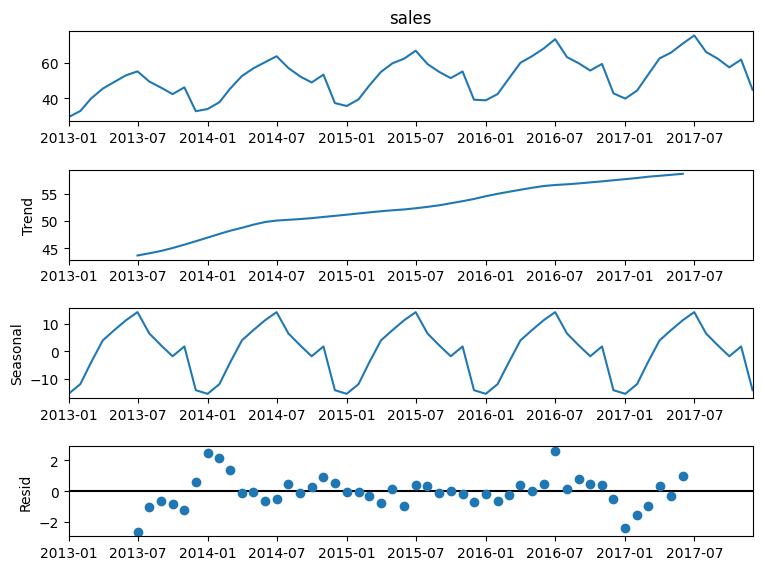

In [54]:
#Time Series Decomposition

train_plot = train.set_index('date')
y = train_plot['sales'].resample('MS').mean() 

result = sm.tsa.seasonal_decompose(y, model='additive')
fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(8, 6)

- 1st graph: the dataset is not stationary, it would be easier to have a future prediction simply by taking mean values if it was stationary,
- 2nd graph: there is an increasing trend over time,
- 3rd graph: a repeating pattern is observed, so there is seasonality- moving upwards on July.
- 4th graph: residuals are decomposing randomly around 0, so the series is additive.

<a id='Feature_Engineering'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">5. Feature Engineering</h1>

<a id='Features'></a>
<h3 style="color:#fd7751">5.1 Create Features</h3>

- Time Related Features: 
In order to search for seasonalities, date variable will be used to derive new features and different time periods will be created.
- Lagged Features:
Time Series theory states that, the value in time: t highly depends on the value in time: t-1. That is why I will be shifting all the sales values by 1 and adding noise.

- Moving Average Features:
In order to find out possible seasonalities, I will be creating moving averagesfor specified time intervals. This function takes the number of time given as window parameter and takes the average of the values, but one of the values is the value on this specific observation. In order to eliminate today's affect on moving average values, I will take 1 shift and use this function

- Exponentially Weighted Mean Features:
The value in time t highly depends on the value in time t-1, so in order to have a better prediction, while computing the average value, the values should not be equally weighted.

- Grouping store/item in to groups
Grouping stores into bins by their sales and items into bins by their sales

In [70]:
def create_time_features(df):
    df['day_of_month'] = df.date.dt.day
    df['day_of_year'] = df.date.dt.dayofyear
    df['week_of_year'] = df.date.dt.weekofyear
    # 1.1.2013 is Tuesday, so our starting point is the 2nd day of week
    df['day_of_week'] = df.date.dt.dayofweek + 1
    df['year'] = df.date.dt.year
    df['month'] = df.date.dt.month
    df["quarter"] = df.date.dt.quarter
    df["is_wknd"] = df.date.dt.weekday // 4
    df['is_month_start'] = df.date.dt.is_month_start.astype(int)
    df['is_month_end'] = df.date.dt.is_month_end.astype(int)
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype(int)
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype(int)
    df['is_year_start'] = df.date.dt.is_year_start.astype(int)
    df['is_year_end'] = df.date.dt.is_year_end.astype(int)
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = np.where(df.month.isin([9, 10, 11]), 3, df["season"])
    
    return df

df = create_time_features(df)
    

In [71]:
df

,date,store,item,sales,id,day_of_month,day_of_year,week_of_year,day_of_week,year,month,quarter,is_wknd,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season
0,2013-01-01,1,1,13.0,NaN,1,1,1,2,2013,1,1,0,1,0,1,0,1,0,0
1,2013-01-02,1,1,11.0,NaN,2,2,1,3,2013,1,1,0,0,0,0,0,0,0,0
2,2013-01-03,1,1,14.0,NaN,3,3,1,4,2013,1,1,0,0,0,0,0,0,0,0
3,2013-01-04,1,1,13.0,NaN,4,4,1,5,2013,1,1,1,0,0,0,0,0,0,0
4,2013-01-05,1,1,10.0,NaN,5,5,1,6,2013,1,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,2018-03-27,10,50,NaN,44995.0,27,86,13,2,2018,3,1,0,0,0,0,0,0,0,1
44996,2018-03-28,10,50,NaN,44996.0,28,87,13,3,2018,3,1,0,0,0,0,0,0,0,1
44997,2018-03-29,10,50,NaN,44997.0,29,88,13,4,2018,3,1,0,0,0,0,0,0,0,1
44998,2018-03-30,10,50,NaN,44998.0,30,89,13,5,2018,3,1,1,0,0,0,0,0,0,1


In [72]:
def drop_cor(dataframe, name, index):
    ind = dataframe[dataframe.columns[dataframe.columns.str.contains(name)].tolist()+["sales"]].corr().sales.sort_values(ascending = False).index[1:index]
    ind = dataframe.drop(ind, axis = 1).columns[dataframe.drop(ind, axis = 1).columns.str.contains(name)]
    dataframe.drop(ind, axis = 1, inplace = True)



lags = [91, 92,93,94,95,96, 97, 98, 100, 105, 112, 119, 126, 150,182,200,220, 250, 300, 350, 355, 360,361,362,363, 364,
        365, 370, 375,380, 546, 600, 650, 680, 690, 700, 710, 728,730, 800, 900, 950, 990, 1000, 1050, 1090, 1095]

def create_lag_features(df, lags, groups = ["store", "item"], target = "sales", prefix = ''):
    df = df.copy()
    for lag in lags:
        df[prefix + str(lag)] = df.groupby(groups)[target].transform(lambda x: x.shift(lag))
    return df
    
    
df = create_lag_features(df, lags,groups = ["store", "item"], target = 'sales', prefix = 'sales_lag_')    

drop_cor(df, "sales_lag", 16)

df = create_lag_features(df, lags = np.arange(12,41, 1).tolist()+[91, 92, 95, 98, 99, 100, 105, 112, 119, 126, 133, 140, 200, 205, 210, 215, 220, 250],
                  groups = ["store", "item", "day_of_week"], target = 'sales', prefix = 'dayofweek_sales_lag_')

drop_cor(df, "dayofweek_sales_lag_", 16)

df = create_lag_features(df, lags= [1,2,3,4], groups = ["day_of_year", "store", "item"], target = 'sales', prefix = 'dayofyear_sales_lag_') 


In [65]:
windows = [91, 98, 105, 112, 119, 126, 186, 200, 210, 250, 300, 365, 546, 700, 730]

def create_roll_features(df, windows, groups = ["store", "item"], target = "sales"):
    df = df.copy()
    for window in windows:
        df['sales_roll_mean_' + str(window)] = df.groupby(groups)[target]. \
                                                          transform(
            lambda x: x.shift(1).rolling(window=window, min_periods=10, win_type="triang").mean()) 
    return df
    
df =  create_roll_features(df=df, groups = ["store", "item"], target = 'sales', windows = windows )

In [66]:
alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
lags = [91, 98, 105, 112, 180, 270, 365, 546, 728]

def create_ewm_features(df, alphas, lags):
    df = df.copy()
    for alpha in alphas:
        for lag in lags:
            df['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)] = \
                df.groupby(["store", "item"])['sales'].transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())
    return df

df = create_ewm_features(df, alphas, lags)

In [67]:
def create_grouping_features(df, target, bins):
    df = df.copy()
    cluster = df.groupby(target).sales.mean().reset_index()
    cluster[target+"_cluster"] = pd.cut(cluster.sales, bins = bins, labels=range(1,bins+1))
    cluster.drop("sales", axis=1, inplace=True)
    return cluster

cluster = create_grouping_features(df, 'store', 4)

df = pd.merge(df, cluster, how="left")

cluster = create_grouping_features(df, 'item', 5)

df = pd.merge(df, cluster, how="left")




In [70]:
df.shape
df = df.sort_values("date").reset_index(drop = True)
df.to_csv("df_features.csv", index=False)

<a id='Split_Data'></a>
<h3 style="color:#fd7751">5.2 Split Train and Validate data</h3>

In [93]:
df = pd.read_csv("df_features.csv")

train = df.loc[(df["date"] < "2017-10-01"), :]
val = df.loc[(df["date"] >= "2017-10-01") & (df["date"] < "2018-01-01"), :]

cols = [col for col in train.columns if col not in ['date', 'id', "sales", "year"]]

y_train = train['sales']
X_train = train[cols]

y_val = val['sales']
X_val = val[cols]



In [94]:
X_train.to_csv("X_train.csv", index=False)
y_train.to_csv("y_train.csv", index=False)
X_val.to_csv("X_val.csv", index=False)
y_val.to_csv("y_val.csv", index=False)

<a id='Model_Building'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">6. Light GBM Model Building</h1>

<a id='Model_Default'></a>
<h3 style="color:#fd7751">6.1 Light GBM Default Parameters Model</h3>

In [66]:
X_train = pd.read_csv("X_train.csv")
y_train = pd.read_csv("y_train.csv")
X_val = pd.read_csv("X_val.csv")
y_val = pd.read_csv("y_val.csv")

In [96]:
y_train

0          13.0
1          16.0
2          20.0
3          34.0
4          19.0
          ...  
866995     62.0
866996     66.0
866997    136.0
866998     25.0
866999    134.0
Name: sales, Length: 867000, dtype: float64

In [97]:
#custom cost function
def smape(preds, target):
    n = len(preds)
    masked_arr = ~((preds == 0) & (target == 0))
    preds, target = preds[masked_arr], target[masked_arr]
    num = np.abs(preds-target)
    denom = np.abs(preds)+np.abs(target)
    smape_val = (200*np.sum(num/denom))/n
    return smape_val

def lgbm_smape(y_true, y_pred):
    smape_val = smape(y_true, y_pred)
    return 'SMAPE', smape_val, False

In [121]:
y_train_pred = first_model.predict(X_train)

In [98]:
first_model = lgb.LGBMRegressor(random_state=384).fit(X_train, y_train, 
                                                      eval_metric= lambda y_true, y_pred: [lgbm_smape(y_true, y_pred)])

print("TRAIN SMAPE:", smape(y_train, first_model.predict(X_train)))
print("VALID SMAPE:", smape(y_val, first_model.predict(X_val)))

TRAIN SMAPE: 12.862501394054174
VALID SMAPE: 12.61460986769879


In [99]:
y_train.shape

(867000,)

In [122]:
y_train_pred.shape

(867000,)

<a id='Feature_Importance'></a>
<h4>Feature Importance</h4>

In [100]:
def plot_lgb_importances(model, plot=False, num=10):
    from matplotlib import pyplot as plt
    import seaborn as sns
    gain = model.booster_.feature_importance(importance_type='gain')
    feat_imp = pd.DataFrame({'feature': model.feature_name_,
                             'split': model.booster_.feature_importance(importance_type='split'),
                             'gain': 100 * gain / gain.sum()}).sort_values('gain', ascending=False)
    if plot:
        plt.figure(figsize=(10, 10))
        sns.set(font_scale=1)
        sns.barplot(x="gain", y="feature", data=feat_imp[0:25])
        plt.title('feature')
        plt.tight_layout()
        plt.show()
    else:
        print(feat_imp.head(num))
        return feat_imp



In [101]:
feature_imp_df = plot_lgb_importances(first_model, num=50)
feature_imp_df

                         feature  split       gain
50            sales_roll_mean_91    169  67.563835
22                 sales_lag_364    407  16.354833
16                 sales_lag_350    186   4.584747
64           sales_roll_mean_730     62   2.668468
5                    day_of_week    280   2.059825
15                        season     78   0.949430
109   sales_ewm_alpha_05_lag_728     47   0.738136
6                          month    264   0.664272
107   sales_ewm_alpha_05_lag_365     90   0.603160
98    sales_ewm_alpha_07_lag_365     22   0.568515
39       dayofweek_sales_lag_105     40   0.495978
4                   week_of_year     61   0.280850
100   sales_ewm_alpha_07_lag_728     13   0.264986
63           sales_roll_mean_700     31   0.254389
3                    day_of_year    193   0.219487
91    sales_ewm_alpha_08_lag_728     12   0.185588
33        dayofweek_sales_lag_40     31   0.168953
111                 item_cluster     50   0.154399
62           sales_roll_mean_54

,feature,split,gain
50,sales_roll_mean_91,169,67.563835
22,sales_lag_364,407,16.354833
16,sales_lag_350,186,4.584747
64,sales_roll_mean_730,62,2.668468
5,day_of_week,280,2.059825
...,...,...,...
14,is_year_end,0,0.000000
13,is_year_start,0,0.000000
11,is_quarter_start,0,0.000000
9,is_month_start,0,0.000000


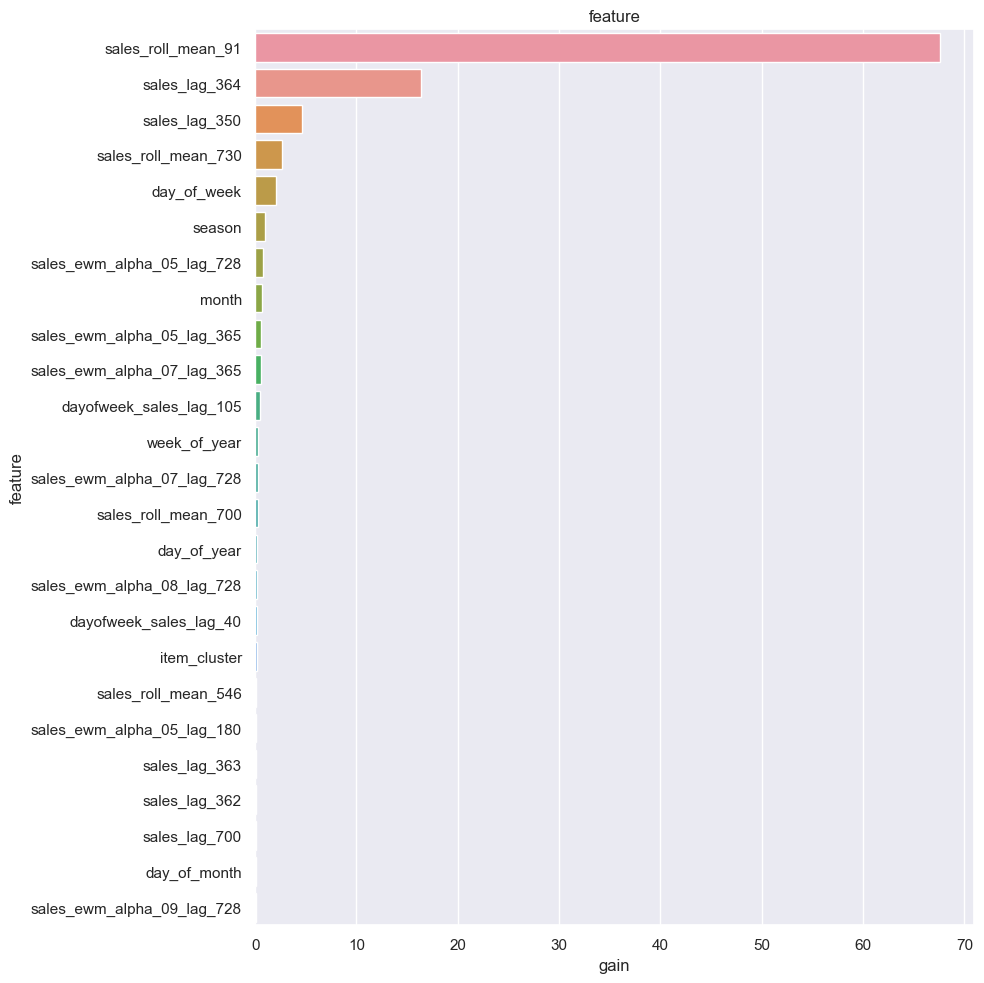

In [102]:
plot_lgb_importances(first_model, plot=True, num=30)

<a id='Shap'></a>
<h4>Shap</h4>

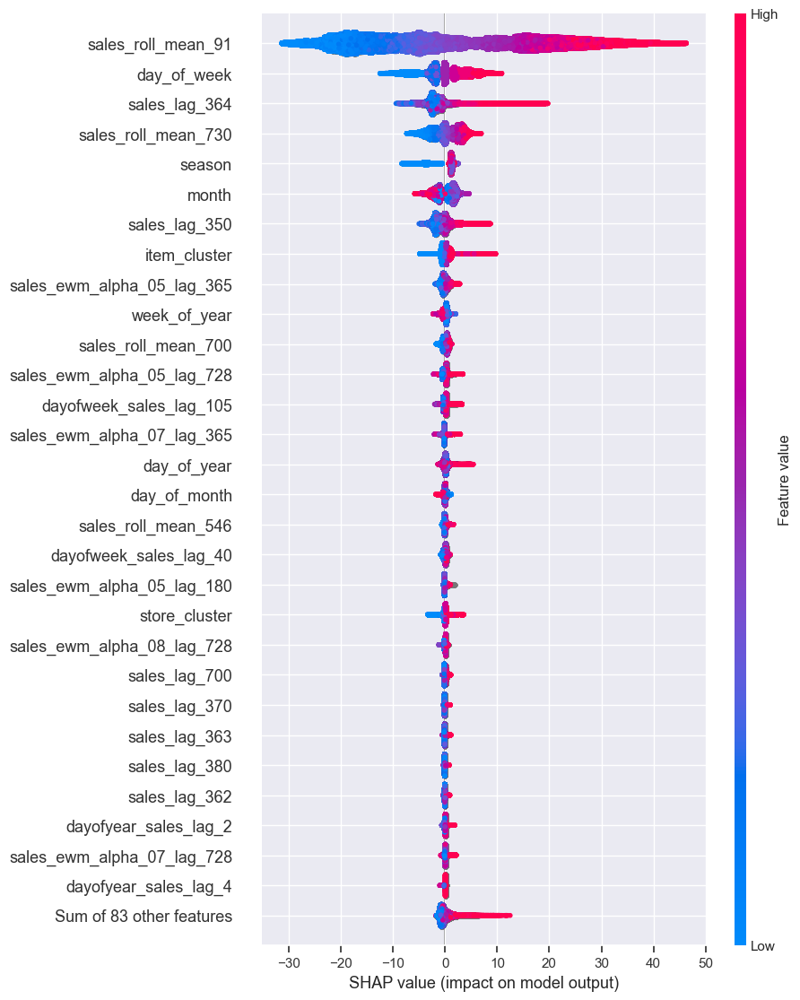

In [103]:
explainer = shap.Explainer(first_model)
shap_values_train = explainer(X_train)
shap_values_valid = explainer(X_val)

shap.plots.beeswarm(shap_values_train, max_display=30)

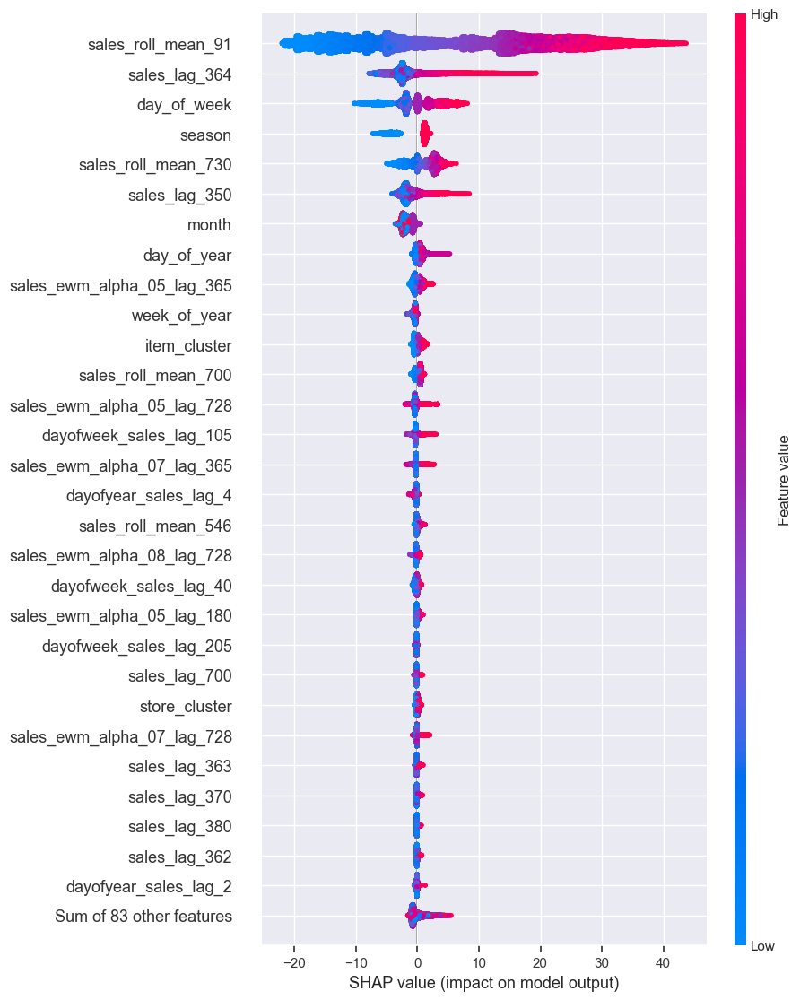

In [104]:
shap.plots.beeswarm(shap_values_valid, max_display=30)

In [105]:
shap.initjs()
shap.plots.force(shap_values_valid[0])

<a id='Error'></a>
<h4>Error</h4>

In [83]:
error = pd.DataFrame({
    "date":val.date,
    "store":X_val.store,
    "item":X_val.item,
    "actual":y_val,
    "pred":first_model.predict(X_val)
}).reset_index(drop = True)

error["error"] = np.abs(error.actual-error.pred)

error.sort_values("error", ascending=False).head(20)


,date,store,item,actual,pred,error
45052,2017-12-30,3,24,108.0,67.478911,40.521089
20923,2017-11-11,9,38,146.0,105.647930,40.352070
24833,2017-11-19,9,25,149.0,109.151201,39.848799
9081,2017-10-19,9,33,117.0,79.413776,37.586224
30277,2017-11-30,9,36,126.0,88.422506,37.577494
30537,2017-12-01,8,28,70.0,106.987889,36.987889
15111,2017-10-31,3,38,62.0,98.775016,36.775016
18979,2017-11-07,3,48,95.0,58.628527,36.371473
7208,2017-10-15,8,18,110.0,146.223373,36.223373
27580,2017-11-25,1,28,142.0,106.196863,35.803137


<AxesSubplot: xlabel='date'>

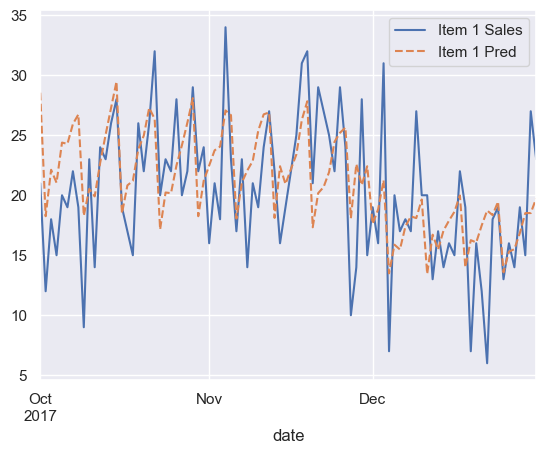

In [84]:
sub = error[error.store == 1].set_index("date")

sub[sub.item == 1].actual.plot( legend=True, label = "Item "+str(1)+" Sales")
sub[sub.item == 1].pred.plot(legend=True, label="Item " + str(1) + " Pred", linestyle = "dashed")

<a id='Model_Feature_Selection'></a>
<h3 style="color:#fd7751">6.2 Light GBM Model with Feature selection</h3>

In [86]:
cols = feature_imp_df[feature_imp_df.gain > 0.015].feature.tolist()
print("Independent Variables:", len(cols))

second_model = lgb.LGBMRegressor(random_state=384).fit(
    X_train[cols], y_train, 
    eval_metric= lambda y_true, y_pred: [lgbm_smape(y_true, y_pred)])

print("TRAIN SMAPE:", smape(y_train, second_model.predict(X_train[cols])))
print("VALID SMAPE:", smape(y_val, second_model.predict(X_val[cols])))

Independent Variables: 41
TRAIN SMAPE: 12.863457862334867
VALID SMAPE: 12.60487454926744


<a id='Model_Tuning'></a>
<h3 style="color:#fd7751">6.3 Light GBM Model with Feature selection and Hyperparameter Tuning</h3>

In [ ]:
lgbm_params = {

"num_leaves":[20,31], # Default 31
"max_depth":[-1, 20, 30], # Default -1
"learning_rate":[0.1, 0.05], # Default 0.1
"n_estimators":[10000,15000], # Default 100
"min_split_gain":[0.0, 2,5], # Default 0
"min_child_samples":[10, 20, 30], # Default 20
"colsample_bytree":[0.5, 0.8, 1.0], # Default 1
"reg_alpha":[0.0, 0.5, 1], # Default 0
"reg_lambda":[0.0, 0.5, 1] # Default 0
}

model = lgb.LGBMRegressor(random_state=384)
tscv = TimeSeriesSplit(n_splits=3)

random_search = RandomizedSearchCV(model, lgbm_params, random_state=384, cv=tscv, scoring=make_scorer(smape), verbose = True, n_jobs = -1).fit( X_train[cols], y_train )

print(random_search.bestparams)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


<a id='LSTM'></a>
<h1 style="background-color:#5280c8;font-family:monospace;font-size:250%;text-align:center">7. LSTM </h1>

<a id='Transform_Data_LSTM'></a>
<h3 style="color:#fd7751">7.1 Transform the data into a time series problem</h3>

In [8]:
#only use part of train data

train_new = train[(train['date'] >= '2017-01-01')]

train_gp = train_new.sort_values('date').groupby(['item', 'store', 'date'], as_index=False)
train_gp = train_gp.agg({'sales':['mean']})
train_gp.columns = ['item', 'store', 'date', 'sales']

In [10]:
train_gp.to_csv("train_data_lsmt.csv", index=False)

In [11]:
def series_to_supervised(data, window=1, lag=1, dropnan=True):
    cols, names = list(), list()
    # Input sequence (t-n, ... t-1)
    for i in range(window, 0, -1):
        cols.append(data.shift(i))
        names += [('%s(t-%d)' % (col, i)) for col in data.columns]
    # Current timestep (t=0)
    cols.append(data)
    names += [('%s(t)' % (col)) for col in data.columns]
    # Target timestep (t=lag)
    cols.append(data.shift(-lag))
    names += [('%s(t+%d)' % (col, lag)) for col in data.columns]
    # Put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # Drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

#Transform the data into a time series problem

In [18]:
window = 29
lag = 90
series = series_to_supervised(train_gp.drop('date', axis=1), window=window, lag=lag)
series

,item(t-29),store(t-29),sales(t-29),item(t-28),store(t-28),sales(t-28),item(t-27),store(t-27),sales(t-27),item(t-26),store(t-26),sales(t-26),item(t-25),store(t-25),sales(t-25),item(t-24),store(t-24),sales(t-24),item(t-23),store(t-23),sales(t-23),item(t-22),store(t-22),sales(t-22),item(t-21),store(t-21),sales(t-21),item(t-20),store(t-20),sales(t-20),item(t-19),store(t-19),sales(t-19),item(t-18),store(t-18),sales(t-18),item(t-17),store(t-17),sales(t-17),item(t-16),store(t-16),sales(t-16),item(t-15),store(t-15),sales(t-15),item(t-14),store(t-14),sales(t-14),item(t-13),store(t-13),sales(t-13),item(t-12),store(t-12),sales(t-12),item(t-11),store(t-11),sales(t-11),item(t-10),store(t-10),sales(t-10),item(t-9),store(t-9),sales(t-9),item(t-8),store(t-8),sales(t-8),item(t-7),store(t-7),sales(t-7),item(t-6),store(t-6),sales(t-6),item(t-5),store(t-5),sales(t-5),item(t-4),store(t-4),sales(t-4),item(t-3),store(t-3),sales(t-3),item(t-2),store(t-2),sales(t-2),item(t-1),store(t-1),sales(t-1),item(t),store(t),sales(t),item(t+90),store(t+90),sales(t+90)
29,1.0,1.0,19.0,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1,1,9.0,1.0,1.0,33.0
30,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1,1,17.0,1.0,1.0,15.0
31,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1,1,15.0,1.0,1.0,21.0
32,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1.0,1.0,15.0,1,1,17.0,1.0,1.0,29.0
33,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1.0,1.0,15.0,1.0,1.0,17.0,1,1,24.0,1.0,1.0,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182405,50.0,10.0,79.0,50.0,10.0,89.0,50.0,10.0,96.0,50.0,10.0,92.0,50.0,10.0,102.0,50.0,10.0,60.0,50.0,10.0,81.0,50.0,10.0,79.0,50.0,10.0,78.0,50.0,10.0,97.0,50.0,10.0,93.0,50.0,10.0,96.0,50.0,10.0,74.0,50.0,10.0,70.0,50.0,10.0,84.0,50.0,10.0,90.0,50.0,10.0,94.0,50.0,10.0,97.0,50.0,10.0,107.0,50.0,10.0,61.0,50.0,10.0,84.0,50.0,10.0,72.0,50.0,10.0,89.0,50.0,10.0,97.0,50.0,10.0,97.0,50.0,10.0,99.0,50.0,10.0,63.0,50.0,10.0,79.0,50.0,10.0,80.0,50,10,82.0,50.0,10.0,63.0
182406,50.0,10.0,89.0,50.0,10.0,96.0,50.0,10.0,92.0,50.0,10.0,102.0,50.0,10.0,60.0,50.0,10.0,81.0,50.0,10.0,7

In [19]:
#Drop rows with different item or store values than the shifted columns
last_item = 'item(t-%d)' % window
last_store = 'store(t-%d)' % window
series = series[(series['store(t)'] == series[last_store])]
series = series[(series['item(t)'] == series[last_item])]

In [20]:
series

,item(t-29),store(t-29),sales(t-29),item(t-28),store(t-28),sales(t-28),item(t-27),store(t-27),sales(t-27),item(t-26),store(t-26),sales(t-26),item(t-25),store(t-25),sales(t-25),item(t-24),store(t-24),sales(t-24),item(t-23),store(t-23),sales(t-23),item(t-22),store(t-22),sales(t-22),item(t-21),store(t-21),sales(t-21),item(t-20),store(t-20),sales(t-20),item(t-19),store(t-19),sales(t-19),item(t-18),store(t-18),sales(t-18),item(t-17),store(t-17),sales(t-17),item(t-16),store(t-16),sales(t-16),item(t-15),store(t-15),sales(t-15),item(t-14),store(t-14),sales(t-14),item(t-13),store(t-13),sales(t-13),item(t-12),store(t-12),sales(t-12),item(t-11),store(t-11),sales(t-11),item(t-10),store(t-10),sales(t-10),item(t-9),store(t-9),sales(t-9),item(t-8),store(t-8),sales(t-8),item(t-7),store(t-7),sales(t-7),item(t-6),store(t-6),sales(t-6),item(t-5),store(t-5),sales(t-5),item(t-4),store(t-4),sales(t-4),item(t-3),store(t-3),sales(t-3),item(t-2),store(t-2),sales(t-2),item(t-1),store(t-1),sales(t-1),item(t),store(t),sales(t),item(t+90),store(t+90),sales(t+90)
29,1.0,1.0,19.0,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1,1,9.0,1.0,1.0,33.0
30,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1,1,17.0,1.0,1.0,15.0
31,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1,1,15.0,1.0,1.0,21.0
32,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1.0,1.0,15.0,1,1,17.0,1.0,1.0,29.0
33,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,1.0,20.0,1.0,1.0,18.0,1.0,1.0,11.0,1.0,1.0,14.0,1.0,1.0,17.0,1.0,1.0,7.0,1.0,1.0,16.0,1.0,1.0,29.0,1.0,1.0,15.0,1.0,1.0,14.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,22.0,1.0,1.0,13.0,1.0,1.0,21.0,1.0,1.0,9.0,1.0,1.0,18.0,1.0,1.0,14.0,1.0,1.0,13.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,24.0,1.0,1.0,9.0,1.0,1.0,17.0,1.0,1.0,15.0,1.0,1.0,17.0,1,1,24.0,1.0,1.0,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182405,50.0,10.0,79.0,50.0,10.0,89.0,50.0,10.0,96.0,50.0,10.0,92.0,50.0,10.0,102.0,50.0,10.0,60.0,50.0,10.0,81.0,50.0,10.0,79.0,50.0,10.0,78.0,50.0,10.0,97.0,50.0,10.0,93.0,50.0,10.0,96.0,50.0,10.0,74.0,50.0,10.0,70.0,50.0,10.0,84.0,50.0,10.0,90.0,50.0,10.0,94.0,50.0,10.0,97.0,50.0,10.0,107.0,50.0,10.0,61.0,50.0,10.0,84.0,50.0,10.0,72.0,50.0,10.0,89.0,50.0,10.0,97.0,50.0,10.0,97.0,50.0,10.0,99.0,50.0,10.0,63.0,50.0,10.0,79.0,50.0,10.0,80.0,50,10,82.0,50.0,10.0,63.0
182406,50.0,10.0,89.0,50.0,10.0,96.0,50.0,10.0,92.0,50.0,10.0,102.0,50.0,10.0,60.0,50.0,10.0,81.0,50.0,10.0,7

In [21]:
#Remove unwanted columns

columns_to_drop = [('%s(t+%d)' % (col, lag)) for col in ['item', 'store']]
for i in range(window, 0, -1):
    columns_to_drop += [('%s(t-%d)' % (col, i)) for col in ['item', 'store']]
series.drop(columns_to_drop, axis=1, inplace=True)
series.drop(['item(t)', 'store(t)'], axis=1, inplace=True)

In [23]:
series.to_csv("time_series_lsmt.csv", index=False)

In [107]:
series = pd.read_csv("time_series_lsmt.csv")

In [108]:
series

,sales(t-29),sales(t-28),sales(t-27),sales(t-26),sales(t-25),sales(t-24),sales(t-23),sales(t-22),sales(t-21),sales(t-20),sales(t-19),sales(t-18),sales(t-17),sales(t-16),sales(t-15),sales(t-14),sales(t-13),sales(t-12),sales(t-11),sales(t-10),sales(t-9),sales(t-8),sales(t-7),sales(t-6),sales(t-5),sales(t-4),sales(t-3),sales(t-2),sales(t-1),sales(t),sales(t+90)
0,19.0,15.0,10.0,16.0,14.0,24.0,14.0,20.0,18.0,11.0,14.0,17.0,7.0,16.0,29.0,15.0,14.0,10.0,16.0,22.0,13.0,21.0,9.0,18.0,14.0,13.0,10.0,16.0,24.0,9.0,33.0
1,15.0,10.0,16.0,14.0,24.0,14.0,20.0,18.0,11.0,14.0,17.0,7.0,16.0,29.0,15.0,14.0,10.0,16.0,22.0,13.0,21.0,9.0,18.0,14.0,13.0,10.0,16.0,24.0,9.0,17.0,15.0
2,10.0,16.0,14.0,24.0,14.0,20.0,18.0,11.0,14.0,17.0,7.0,16.0,29.0,15.0,14.0,10.0,16.0,22.0,13.0,21.0,9.0,18.0,14.0,13.0,10.0,16.0,24.0,9.0,17.0,15.0,21.0
3,16.0,14.0,24.0,14.0,20.0,18.0,11.0,14.0,17.0,7.0,16.0,29.0,15.0,14.0,10.0,16.0,22.0,13.0,21.0,9.0,18.0,14.0,13.0,10.0,16.0,24.0,9.0,17.0,15.0,17.0,29.0
4,14.0,24.0,14.0,20.0,18.0,11.0,14.0,17.0,7.0,16.0,29.0,15.0,14.0,10.0,16.0,22.0,13.0,21.0,9.0,18.0,14.0,13.0,10.0,16.0,24.0,9.0,17.0,15.0,17.0,24.0,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167905,79.0,89.0,96.0,92.0,102.0,60.0,81.0,79.0,78.0,97.0,93.0,96.0,74.0,70.0,84.0,90.0,94.0,97.0,107.0,61.0,84.0,72.0,89.0,97.0,97.0,99.0,63.0,79.0,80.0,82.0,63.0
167906,89.0,96.0,92.0,102.0,60.0,81.0,79.0,78.0,97.0,93.0,96.0,74.0,70.0,84.0,90.0,94.0,97.0,107.0,61.0,84.0,72.0,89.0,97.0,97.0,99.0,63.0,79.0,80.0,82.0,90.0,59.0
167907,96.0,92.0,102.0,60.0,81.0,79.0,78.0,97.0,93.0,96.0,74.0,70.0,84.0,90.0,94.0,97.0,107.0,61.0,84.0,72.0,89.0,97.0,97.0,99.0,63.0,79.0,80.0,82.0,90.0,103.0,74.0
167908,92.0,102.0,60.0,81.0,79.0,78.0,97.0,93.0,96.0,74.0,70.0,84.0,90.0,94.0,97.0,107.0,61.0,84.0,72.0,89.0,97.0,97.0,99.0,63.0,79.0,80.0,82.0,90.0,103.0,99.0,62.0


<a id='Split_Data_LSTM'></a>
<h3 style="color:#fd7751">7.2 Train/validation split</h3>

In [109]:
#Train/validation split
# Label

lag_size = 90
labels_col = 'sales(t+%d)' % lag_size
labels = series[labels_col]
series = series.drop(labels_col, axis=1)

X_train_dl, X_valid_dl, y_train_dl, y_valid_dl = train_test_split(series, labels.values, test_size=0.4, random_state=0)
print('Train set shape', X_train_dl.shape)
print('Validation set shape', X_valid_dl.shape)


Train set shape (100746, 30)
Validation set shape (67164, 30)


In [110]:
X_train_dl.to_csv("X_train_dl.csv", index=False)
X_valid_dl.to_csv("X_valid_dl.csv", index=False)

savetxt('y_train_dl.csv', y_train_dl, delimiter=',')
savetxt('y_valid_dl.csv', y_valid_dl, delimiter=',')


<a id='Model_Build_LSTM'></a>
<h3 style="color:#fd7751">7.3 Model Building</h3>

<h4>MLP Model</h4>

- First we will use a Multilayer Perceptron model or MLP model, here our model will have input features equal to the window size.
- The thing with MLP models is that the model don't take the input as sequenced data, so for the model, it is just receiving inputs and don't treat them as sequenced data, that may be a problem since the model won't see the data with the sequence patter that it has.
- Input shape [samples, timesteps].

In [77]:
X_train_dl = pd.read_csv("X_train_lsmt.csv")
X_valid_dl = pd.read_csv("X_valid_lsmt.csv")
y_train_dl = pd.read_csv("y_train_lsmt.csv")
y_valid_dl = pd.read_csv("y_valid_lsmt.csv")

In [112]:
epochs = 40
batch = 256
# learning rate
lr = 0.0003 
adam = optimizers.Adam(lr)

model_mlp = Sequential()
model_mlp.add(Dense(100, activation='relu', input_dim=X_train_dl.shape[1]))
model_mlp.add(Dense(1))
model_mlp.compile(loss='mse', optimizer=adam)
model_mlp.summary()

mlp_history = model_mlp.fit(X_train_dl.values, y_train_dl, validation_data=(X_valid_dl.values, y_valid_dl), epochs=epochs, verbose=2)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 100)               3100      
                                                                 
 dense_13 (Dense)            (None, 1)                 101       
                                                                 
Total params: 3,201
Trainable params: 3,201
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
3149/3149 - 8s - loss: 432.9298 - val_loss: 384.4772 - 8s/epoch - 3ms/step
Epoch 2/40
3149/3149 - 7s - loss: 381.4815 - val_loss: 368.0750 - 7s/epoch - 2ms/step
Epoch 3/40
3149/3149 - 7s - loss: 368.0170 - val_loss: 387.9118 - 7s/epoch - 2ms/step
Epoch 4/40
3149/3149 - 7s - loss: 361.8452 - val_loss: 358.1507 - 7s/epoch - 2ms/step
Epoch 5/40
3149/3149 - 8s - loss: 357.9236 - val_loss: 376.7836 - 8s/epoch - 2ms/step
Epoch 6/40
3149/31

<h4>CNN Model</h4>

- For the CNN model we will use one convolutional hidden layer followed by a max pooling layer. 
- The filter maps are then flattened before being interpreted by a Dense layer and outputting a prediction.
- The convolutional layer should be able to identify patterns between the timesteps.
- Input shape [samples, timesteps, features].

In [113]:
X_train_series = X_train_dl.values.reshape((X_train_dl.shape[0], X_train_dl.shape[1], 1))
X_valid_series = X_valid_dl.values.reshape((X_valid_dl.shape[0], X_valid_dl.shape[1], 1))

In [114]:
model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(50, activation='relu'))
model_cnn.add(Dense(1))
model_cnn.compile(loss='mse', optimizer=adam)
model_cnn.summary()

cnn_history = model_cnn.fit(X_train_series, y_train_dl, validation_data=(X_valid_series, y_valid_dl), epochs=epochs, verbose=2)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 29, 64)            192       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 14, 64)           0         
 1D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 896)               0         
                                                                 
 dense_14 (Dense)            (None, 50)                44850     
                                                                 
 dense_15 (Dense)            (None, 1)                 51        
                                                                 
Total params: 45,093
Trainable params: 45,093
Non-trainable params: 0
__________________________________________________

<h4>LSTM Model</h4>

- Now the LSTM model actually sees the input data as a sequence, so it's able to learn patterns from sequenced data (assuming it exists) better than the other ones, especially patterns from long sequences.
- Input shape [samples, timesteps, features].

In [138]:
model_lstm = Sequential()
model_lstm.add(LSTM(50, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_lstm.add(Dense(1))
model_lstm.compile(loss='mse', optimizer=adam)
model_lstm.summary()

lstm_history = model_lstm.fit(X_train_series, y_train_dl, validation_data=(X_valid_series, y_valid_dl), epochs=epochs, verbose=2)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 50)                10400     
                                                                 
 dense_16 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/40
3149/3149 - 46s - loss: 1071.1678 - val_loss: 381.9073 - 46s/epoch - 15ms/step
Epoch 2/40
3149/3149 - 40s - loss: 397.1423 - val_loss: 427.6286 - 40s/epoch - 13ms/step
Epoch 3/40
3149/3149 - 36s - loss: 401.9710 - val_loss: 378.6301 - 36s/epoch - 11ms/step
Epoch 4/40
3149/3149 - 34s - loss: 378.4915 - val_loss: 375.6852 - 34s/epoch - 11ms/step
Epoch 5/40
3149/3149 - 34s - loss: 380.9421 - val_loss: 404.3163 - 34s/epoch - 11ms/step


<h4>CNN-LSTM Model</h4>

- Input shape [samples, subsequences, timesteps, features].

In [139]:
subsequences = 2
timesteps = X_train_series.shape[1]//subsequences
X_train_series_sub = X_train_series.reshape((X_train_series.shape[0], subsequences, timesteps, 1))
X_valid_series_sub = X_valid_series.reshape((X_valid_series.shape[0], subsequences, timesteps, 1))

In [140]:
model_cnn_lstm = Sequential()
model_cnn_lstm.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train_series_sub.shape[2], X_train_series_sub.shape[3])))
model_cnn_lstm.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model_cnn_lstm.add(TimeDistributed(Flatten()))
model_cnn_lstm.add(LSTM(50, activation='relu'))
model_cnn_lstm.add(Dense(1))
model_cnn_lstm.compile(loss='mse', optimizer=adam)

cnn_lstm_history = model_cnn_lstm.fit(X_train_series_sub, y_train_dl, validation_data=(X_valid_series_sub, y_valid_dl), epochs=epochs, verbose=2)

Epoch 1/40
3149/3149 - 16s - loss: 454.7233 - val_loss: 457.2329 - 16s/epoch - 5ms/step
Epoch 2/40
3149/3149 - 15s - loss: 428.0464 - val_loss: 418.7603 - 15s/epoch - 5ms/step
Epoch 3/40
3149/3149 - 15s - loss: 414.6135 - val_loss: 425.7346 - 15s/epoch - 5ms/step
Epoch 4/40
3149/3149 - 15s - loss: 406.5775 - val_loss: 406.4891 - 15s/epoch - 5ms/step
Epoch 5/40
3149/3149 - 15s - loss: 399.5716 - val_loss: 392.2644 - 15s/epoch - 5ms/step
Epoch 6/40
3149/3149 - 15s - loss: 391.9113 - val_loss: 389.7645 - 15s/epoch - 5ms/step
Epoch 7/40
3149/3149 - 15s - loss: 389.3717 - val_loss: 385.5081 - 15s/epoch - 5ms/step
Epoch 8/40
3149/3149 - 14s - loss: 388.0984 - val_loss: 389.3877 - 14s/epoch - 5ms/step
Epoch 9/40
3149/3149 - 15s - loss: 388.9671 - val_loss: 383.7596 - 15s/epoch - 5ms/step
Epoch 10/40
3149/3149 - 15s - loss: 386.7347 - val_loss: 383.2501 - 15s/epoch - 5ms/step
Epoch 11/40
3149/3149 - 15s - loss: 386.2015 - val_loss: 384.1358 - 15s/epoch - 5ms/step
Epoch 12/40
3149/3149 - 15s - 

<h4>Model Comparison</h4>

In [141]:
mlp_train_pred = model_mlp.predict(X_train_dl.values)
mlp_valid_pred = model_mlp.predict(X_valid_dl.values)

cnn_train_pred = model_cnn.predict(X_train_series)
cnn_valid_pred = model_cnn.predict(X_valid_series)

lstm_train_pred = model_lstm.predict(X_train_series)
lstm_valid_pred = model_cnn.predict(X_valid_series)

cnn_lstm_train_pred = model_cnn_lstm.predict(X_train_series_sub)
cnn_lstm_valid_pred = model_cnn_lstm.predict(X_valid_series_sub)


2099/2099 [==============================] - 4s 2ms/step


In [142]:
mlp_train_pred_reshape  = mlp_train_pred.reshape((mlp_train_pred.shape[0],))

mlp_valid_pred_reshape  = mlp_valid_pred.reshape((mlp_valid_pred.shape[0],))

print("MLP TRAIN SMAPE:", smape(y_train_dl, mlp_train_pred_reshape))
print("MLP VALID SMAPE:", smape(y_valid_dl, mlp_valid_pred_reshape))

cnn_train_pred_reshape = cnn_train_pred.reshape((cnn_train_pred.shape[0],))
cnn_valid_pred_reshape = cnn_valid_pred.reshape((cnn_valid_pred.shape[0],))


print("CNN TRAIN SMAPE:", smape(y_train_dl, cnn_train_pred_reshape))
print("CNN VALID SMAPE:", smape(y_valid_dl, cnn_valid_pred_reshape))


lstm_train_pred_reshape = lstm_train_pred.reshape((lstm_train_pred.shape[0],))
lstm_valid_pred_reshape = lstm_valid_pred.reshape((lstm_valid_pred.shape[0],))

print("LSTM TRAIN SMAPE:", smape(y_train_dl, lstm_train_pred_reshape))
print("LSTM VALID SMAPE:", smape(y_valid_dl, lstm_valid_pred_reshape))

cnn_lstm_train_pred_reshape = cnn_lstm_train_pred.reshape((cnn_lstm_train_pred.shape[0],))
cnn_lstm_valid_pred_reshape = cnn_lstm_valid_pred.reshape((cnn_lstm_valid_pred.shape[0],))

print("LSTM-CNN TRAIN SMAPE:", smape(y_train_dl, cnn_lstm_train_pred_reshape))
print("LSTM-CNN VALID SMAPE:", smape(y_valid_dl, cnn_lstm_valid_pred_reshape))

MLP TRAIN SMAPE: 25.561834211402026
MLP VALID SMAPE: 25.818963426671605
CNN TRAIN SMAPE: 26.36785296656642
CNN VALID SMAPE: 26.560800608721472
LSTM TRAIN SMAPE: 51.67683600196499
LSTM VALID SMAPE: 26.560800608721472
LSTM-CNN TRAIN SMAPE: 27.413647888731823
LSTM-CNN VALID SMAPE: 27.49250152131642
